244329020-Nurdan Ekmen , ChestX-ray8 dataset veri seti'nden alınan göğüs röntgeni görüntüleri ödevş.

Kütüphaneler yüklenir

In [ ]:
# Import necessary packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
import seaborn as sns
sns.set()

In [ ]:
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/

Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 20.39 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


csvden okuyarak, ilk 5 veriyi kontrol ediyoruz. satır ve sütun sayısını çekiyoruz.

In [ ]:
# Read csv file containing training datadata
train_df = pd.read_csv("nih/train-small.csv")
# Print first 5 rows
print(f'There are {train_df.shape[0]} rows and {train_df.shape[1]} columns in this data frame')
train_df.head()

There are 1000 rows and 16 columns in this data frame


,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


Kolon veri tiplerini inceliyoruz.

In [ ]:
# Look at the data type of each column and whether null values are present
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

Tekrarlayan Verilerin Kontrolü

In [ ]:
print(f"The total patient ids are {train_df['PatientId'].count()}, from those the unique ids are {train_df['PatientId'].value_counts().shape[0]} ")

The total patient ids are 1000, from those the unique ids are 928 


train_df veri setindeki tüm sütun adlarını listeliyoruz.

In [ ]:
columns = train_df.keys()
columns = list(columns)
print(columns)

['Image', 'Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'PatientId', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


Gereksiz kolonları çıkarma işlemi

In [ ]:
# Remove unnecesary elements
columns.remove('Image')
columns.remove('PatientId')
# Get the total classes
print(f"There are {len(columns)} columns of labels for these conditions: {columns}")

There are 14 columns of labels for these conditions: ['Atelectasis', 'Cardiomegaly', 'Consolidation', 'Edema', 'Effusion', 'Emphysema', 'Fibrosis', 'Hernia', 'Infiltration', 'Mass', 'Nodule', 'Pleural_Thickening', 'Pneumonia', 'Pneumothorax']


Her bir sütundaki (etiket sınıfındaki) pozitif örneklerin sayısını hesaplayıp ekrana yazdırma işlemi

In [ ]:
# Print out the number of positive labels for each class
for column in columns:
    print(f"The class {column} has {train_df[column].sum()} samples")

The class Atelectasis has 106 samples
The class Cardiomegaly has 20 samples
The class Consolidation has 33 samples
The class Edema has 16 samples
The class Effusion has 128 samples
The class Emphysema has 13 samples
The class Fibrosis has 14 samples
The class Hernia has 2 samples
The class Infiltration has 175 samples
The class Mass has 45 samples
The class Nodule has 54 samples
The class Pleural_Thickening has 21 samples
The class Pneumonia has 10 samples
The class Pneumothorax has 38 samples


Data Visualization

Rastgele 9 görüntü seçiyoruz.3x3  gri tonlamalı olarak görüntüyoruz.

Display Random Images


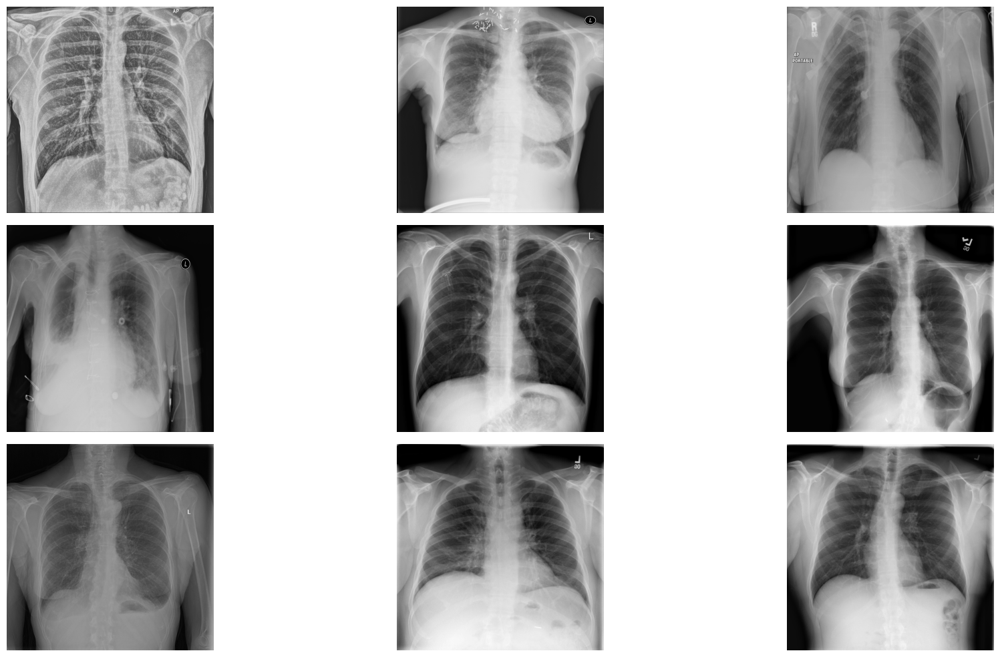

In [ ]:
# Extract numpy values from Image column in data frame
images = train_df['Image'].values

# Extract 9 random images from it
random_images = [np.random.choice(images) for i in range(9)]

# Location of the image dir
img_dir = 'nih/images_small/'

print('Display Random Images')

# Adjust the size of your images
plt.figure(figsize=(20,10))

# Iterate and plot random images
for i in range(9):
    plt.subplot(3, 3, i + 1)
    img = plt.imread(os.path.join(img_dir, random_images[i]))
    plt.imshow(img, cmap='gray')
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()

Görüntü 1: Yüksek ortalama piksel değeri ile parlak bir görüntü. Detaylar net bir şekilde görünmekte.
Görüntü 2: Düşük ortalama piksel değeri ile daha karanlık bir görüntü. Detaylar daha az belirgin.
Görüntü 3: En düşük ortalama piksel değerine sahip, bu nedenle en karanlık görüntü. Detaylar neredeyse görünmez.
Görüntü 4: Orta seviyede parlaklık, ancak yüksek kontrast ile detaylar belirgin.
Görüntü 5: Düşük ortalama piksel değeri ile karanlık bir görüntü. Detaylar yine az görünür.
Görüntü 6: Yüksek ortalama piksel değeri ile parlak bir görüntü. Detaylar net.
Görüntü 7, 8 ve 9: Orta seviyede parlaklık ve kontrast değerlerine sahip dengeli görüntüler. Detaylar belirgin ancak bazı bölgelerde daha fazla netlik sağlanabilir.
Görüntü 1 ve 4: Yüksek netlikte, detaylar belirgin. Özellikle görüntü 4, yüksek kontrast sayesinde detayların daha iyi görünmesini sağlıyor.
Görüntü 3: Düşük netlik, detaylar neredeyse kaybolmuş durumda.
Görüntü 5: Düşük netlik, karanlık alanlar detayları gizliyor.
Görüntü 6: Yüksek netlik, detaylar açıkça görülebiliyor.
Görüntü 7, 8 ve 9: Dengeli netlik, ancak bazı detaylar daha fazla işlenme gerektirebilir.
Görüntü 1 ve 4: Yüksek kontrast, detayların belirginleşmesini sağlıyor. Özellikle görüntü 4, en yüksek kontrasta sahip.
Görüntü 3: Düşük kontrast, detayların kaybolmasına neden oluyor.
Görüntü 2, 5 ve 6: Orta seviyede kontrast, bazı detayların görünürlüğünü etkiliyor.
Görüntü 7, 8 ve 9: Orta seviyede kontrast, dengeli bir görünüm sağlıyor ancak daha fazla kontrast ile detaylar artırılabilir.

Seçilen görüntülerin istatistiklerini yazdırıyoruz. (MAKSIMUM, MINIMUM, MEAN VE STD)

Image 1 - 00026469_006.png:
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.5785 and the standard deviation is 0.1589
--------------------------------------------------
Image 2 - 00009552_000.png:
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.5686 and the standard deviation is 0.2657
--------------------------------------------------
Image 3 - 00000798_010.png:
The dimensions of the image are 1024 pixels width and 1024 pixels height, one single color channel
The maximum pixel value is 1.0000 and the minimum is 0.0000
The mean value of the pixels is 0.4902 and the standard deviation is 0.1601
--------------------------------------------------
Image 4 - 00007670_029.png:
The dimensions of the image ar

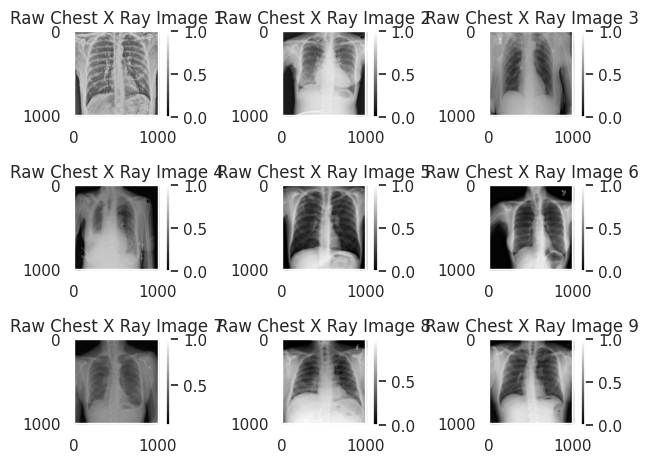

In [ ]:
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Plot the image
    plt.subplot(3, 3, i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.colorbar()
    plt.title(f'Raw Chest X Ray Image {i + 1}')

    # Print the statistical information for each image
    print(f"Image {i + 1} - {img_name}:")
    print(f"The dimensions of the image are {raw_image.shape[0]} pixels width and {raw_image.shape[1]} pixels height, one single color channel")
    print(f"The maximum pixel value is {raw_image.max():.4f} and the minimum is {raw_image.min():.4f}")
    print(f"The mean value of the pixels is {raw_image.mean():.4f} and the standard deviation is {raw_image.std():.4f}")
    print("-" * 50)

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


Görüntü 1, 5, 9: Yüksek kontrasta sahip, detaylar net bir şekilde görülebiliyor.
Görüntü 2, 4, 6: Düşük veya orta düzeyde kontrast, bu da görüntüdeki yapıların belirginliğini azaltıyor.
Görüntü 3, 7, 8: Orta seviyede kontrast. Bazı bölgelerde detaylar daha görünür, ancak diğerleri için iyileştirme yapılabilir.
Görüntü 1: Genel olarak net bir görüntü. Akciğer yapıları belirgin, ancak bazı kenarlarda hafif bulanıklık görülüyor.
Görüntü 2: Daha düşük netlik. Akciğer detaylarında bulanıklık var, bu da görüntünün tıbbi değerlendirmesini zorlaştırabilir.
Görüntü 3: Orta düzeyde netlik. Akciğerler belirgin olsa da bazı bölümlerde belirsizlik mevcut.
Görüntü 4: Düşük netlik, tıbbi analiz için yetersiz. Akciğer yapıları zayıf belirgin.
Görüntü 5: Yüksek netlik. Yapılar net bir şekilde görülebiliyor, belirgin ayrıntılar var.
Görüntü 6: Orta düzey netlik. Bazı detaylar görünür, fakat genel netlik daha fazla iyileştirilmiş olabilirdi.
Görüntü 7: İyi netlik, belirgin yapılar ile ayrıntılar mevcut.
Görüntü 8: Orta düzey netlik. Bazı alanlar daha iyi belirgin hale getirilebilmiş.
Görüntü 9: Yüksek netlik. Akciğer yapıları ve detaylar oldukça belirgin.

Seçilen görüntülerin histogramını çizdiriyoruz

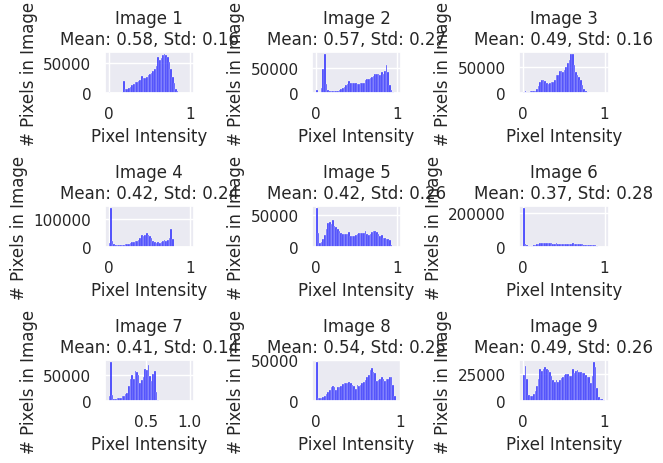

In [ ]:
# Görüntüleri döngüyle gez ve her birinin histogramını çiz
for i, img in enumerate(random_images):  # 'random_images' seçtiğiniz 9 görüntüyü içeren liste
    # Görüntüyü yükle
    raw_image = plt.imread(os.path.join(img_dir, img))

    # Subplot oluştur ve histogramı çiz
    plt.subplot(3, 3, i + 1)
    sns.histplot(raw_image.ravel(), kde=False, color='blue', bins=50)  # 50 binli histogram
    plt.title(f'Image {i+1}\nMean: {np.mean(raw_image):.2f}, Std: {np.std(raw_image):.2f}')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('# Pixels in Image')

# Düzenleme yaparak görseli düzgün göster
plt.tight_layout()
plt.show()

Image 1: Ortalama piksel değeri yüksek (0.58) ve standart sapma orta düzeyde (0.10); bu, görüntünün genel olarak daha açık ve belirgin yapı içerdiğini gösteriyor.

Image 2: Ortalama değer (0.57) yüksek, ancak standart sapma (0.22) daha fazla değişkenlik olduğunu, bu yüzden bazı alanların daha karanlık ya da daha açık olabileceğini gösteriyor.

Image 3: Ortalama piksel değeri (0.49) ortalama, standart sapma (0.16) ise düşük değişkenlik sunarak homojen bir görüntü yapısı sağlıyor.

Image 4: Aşağıdaki ortalama (0.42) ile düşük bir parlaklık gösteriyor ve yüksek standart sapma (0.22), daha fazla karanlık alanın bulunduğunu ima ediyor.

Image 5: Ortalama piksel değeri (0.42) ile Image 4 ile benzerlik gösteriyor ama düşük standart sapma (0.16), bu görüntünün daha homojen olduğunu gösteriyor.

Image 6: Düşük ortalama (0.37) ve yüksek standart sapma (0.28), görüntünün karanlık ve daha fazla değişkenlik içeren alanlara sahip olduğunu ifade ediyor.

Image 7: Ortalama değeri (0.41) düşük ve standart sapma (0.14) ortalaması ile, genel olarak karanlık ama belirli detayların görünür olduğu bir görüntü.

Image 8: Ortalama piksel değeri (0.54) ve standart sapma (0.22) ile daha dengeli bir yapı sunarak, net detaylar barındırabilir.

Image 9: Ortalama piksel değeri (0.49) ortalama seviyede, fakat standart sapma (0.26) biraz yüksek olup, değişkenlık gösteren bölgeler içeriyor.

numpy yüklüyoruz

In [ ]:
pip install numpy

9 GORUNTU ICIN CONTRAST STRECTCHING yapıyoruz ve GAMMA TRANSFORMATIONU uyguladık.

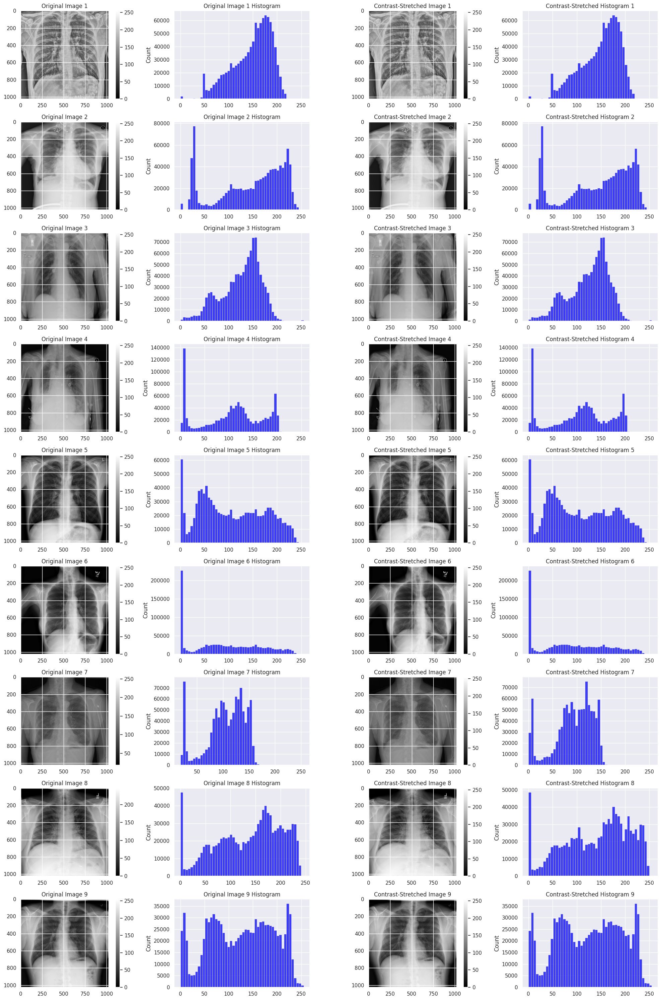

In [ ]:
from skimage import io,exposure

# Increased figure size for better visualization with more subplots
plt.figure(figsize=(20, 30))

for i, img in enumerate(random_images):
    # Görüntüyü yükle
    raw_image = io.imread(os.path.join(img_dir, img))

    # Step 1: Contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 2: Apply histogram equalization after contrast stretching
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 3: Apply gamma correction on the equalized image
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot original image and its histogram
    plt.subplot(9, 4, 4*i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Original Image {i+1}')
    plt.colorbar()

    plt.subplot(9, 4, 4*i + 2) # Changed subplot index to 4*i + 2
    sns.histplot(raw_image.ravel(), kde=False, color='blue', bins=50)
    plt.title(f"Original Image {i+1} Histogram")

    # Plot contrast-stretched image and its histogram
    plt.subplot(9, 4, 4*i + 3) # Changed subplot index to 4*i + 3
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title(f'Contrast-Stretched Image {i+1}')
    plt.colorbar()

    plt.subplot(9, 4, 4*i + 4) # Changed subplot index to 4*i + 4
    sns.histplot(contrast_stretched.ravel(), kde=False, color='blue', bins=50)
    plt.title(f"Contrast-Stretched Histogram {i+1}")

# Düzenleme yaparak görseli düzgün göster
plt.tight_layout()
plt.show()

1. Image 1
Yorum: Orijinal görüntü belirli bir kontrast aralığına sahip, ancak yapılar oldukça gri tonlamalı.
Histogram, dar bir piksel değer dağılımı gösteriyor.
Kontrast ger stretched edilmiş hali, yapıları daha net hale getiriyor ve histogram daha geniş bir dağılım sunarak belirginleşmiş yapılar yaratıyor.
2. Image 2
Yorum: Görüntü, bazı bölgelerde karanlık kalırken, histogramda düşük piksel yoğunluğu gözlemleniyor. Kontrast ger stretched sonrası görüntü daha parlak ve detaylar daha belirgin hale geliyor; histogramda ise geniş bir piksel dağılımı olduğuna dikkat çekiliyor.
3. Image 3
Yorum: Orijinal görüntü, yeterince detay barındırmıyor ve histogramda oldukça dar bir yayılma mevcut. Kontrast ger stretched edince, görüntüdeki detaylar çok daha net çıkıyor ve histogramda piksellerin daha çeşitli dağıldığı gözlemleniyor.
4.Image 4
Yorum: Orijinal görüntü karanlık alanları ön planda tutuyor, histogram ise düşük piksel yoğunluğu içeriyor. Kontrast ger stretched işlemi, görüntüyü daha aydınlatırken histogramda önemli bir genişleme sağlıyor; bu da detayların artmasına yardımcı oluyor.
5.Image 5
Yorum: Orijinal görüntüde yapılar belirgin değil ve histogramda yoğun bir şekilde orta seviyelerde piksel sayımı var. Kontrast ger stretched ile görüntü belirginleşiyor, histogram ise her piksel değeri için daha geniş bir dağılım sunarak genel kontrastı artırıyor.
6.Image 6
Yorum: Bu görüntü oldukça karanlık ve histogramda büyük oranda düşük yoğunluk mevcut. Kontrast ger stretched sonrası daha fazla detay açığa çıkıyor ve histogram, daha simetrik bir dağılım ve daha fazla piksel yoğunluğu sağlıyor.
7.Image 7
Yorum: Orijinal görüntüde, netlik düşük; histogram ise piksel değerlerinin çok dar bir aralıkta yoğunlaştığını gösteriyor. Kontrast ger stretched sonrası, görüntüdeki yapılar belirginleşiyor ve histogram daha geniş bir dağılım sunuyor.
8.Image 8
Yorum: Orijinal görüntüde iyi bir kontrast yok ve histogramda kayda değer bir piksel yoğunluğu yok. Kontrast ger stretched işlemi, görüntüyü önemli ölçüde iyileştirirken histogramda çok daha geniş bir dağılım ve daha yüksek yoğunluk belirtisi var.
9.Image 9
Yorum: Orijinal görüntüde yapıların belirginsizliği var, histogram ise geniş bir dağılım sunmuyor. Kontrast ger stretched sonrası görüntü çok daha net hale geliyor ve histogramda piksel dağılımı belirginleşiyor.

Genel Sonuç
Kontrast ger stretched işlemi, tüm görüntülerdeki detayları belirgin hale getiriyor ve histogramlar üzerinde daha geniş bir piksel değer dağılımı sunarak görüntülerin
genel kalitesini artırıyor.
Orijinal görüntülerde belirgin alanlar sınırlıken, ger stretched edilmiş halleriyle tıbbi değerlendirmeler için daha kullanışlı hale geliyorlar.

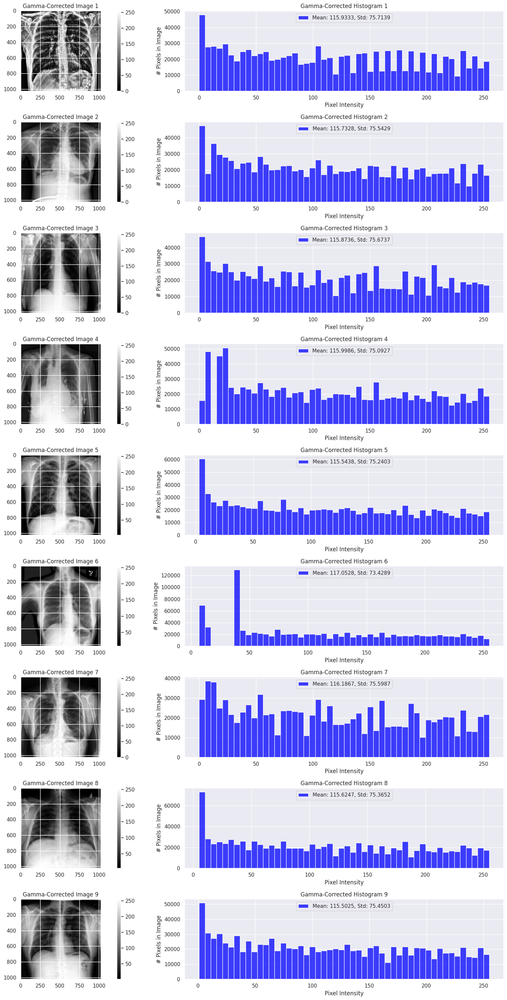

In [ ]:
# 9 görüntü için işlemleri yapacak döngü
plt.figure(figsize=(20, 30))  # Görsellerin daha iyi yerleşmesi için figür boyutunu artırdık

for i, img in enumerate(random_images):
    # Görüntüyü yükle
    raw_image = io.imread(os.path.join(img_dir, img))

    # Step 1: Contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 2: Apply histogram equalization after contrast stretching
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)  # Scale to [0, 255]

    # Step 3: Apply gamma correction on the equalized image
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot gamma-corrected image and its histogram
    plt.subplot(9, 2, 2*i + 1)  # Gamma-corrected image
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image {i+1}')
    plt.colorbar()

    # Plot histogram of gamma-corrected image
    plt.subplot(9, 2, 2*i + 2)  # Histogram of gamma-corrected image
    sns.histplot(gamma_corrected.ravel(), kde=False, color='blue', bins=50)
    plt.title(f"Gamma-Corrected Histogram {i+1}")
    plt.xlabel('Pixel Intensity')
    plt.ylabel('# Pixels in Image')

    # Display mean and standard deviation on the histogram plot
    mean_val = np.mean(gamma_corrected)
    std_val = np.std(gamma_corrected)
    plt.legend(loc='upper center', labels=[f'Mean: {mean_val:.4f}, Std: {std_val:.4f}'])

# Düzenleme yaparak görseli düzgün göster
plt.tight_layout()
plt.show()


1. Gamma-Corrected Image 1
Yorum: Görüntü, yapıları daha belirgin hale getiriyor, histogramda geniş bir dağılım mevcut; ortalama piksel değeri 115.93 ile dengeli bir parlaklık sağlıyor.
2. Gamma-Corrected Image 2
Yorum: Yapılar daha iyi görünür olmuş, histogramda kararlı bir dağılım var; ortalama piksel değeri 115.73 ile görüntünün aydınlık ve net olduğunu gösteriyor.
3. Gamma-Corrected Image 3
Yorum: Detaylar belirginleşmiş; histogram, piksel yoğunluğunun daha dengeli dağıldığını ve ortalama değerin 115.87 olduğunu gösteriyor.
4. Gamma-Corrected Image 4
Yorum: Düzeltme ile karanlık bölgelerde belirginlik artmış; histogramda 115.99 ortalaması, daha iyi bir görsellik sağlıyor.
5. Gamma-Corrected Image 5
Yorum: Görüntü, netlik kazanmış, ancak histogramda daha düşük bir ortalama (115.54) belirgin. Bu bazı detayların kaybolmuş olabileceğini gösterebilir.
6. Gamma-Corrected Image 6
Yorum: Görüntüde eskiyle kıyasla belirgin bir aydınlanma var, histogramda ortalama 117.05 ile daha açık bir ton sunulmuş.
7. Gamma-Corrected Image 7
Yorum: Yüksek netlik ve belirginlik sağlanmış; histogram, ortalama 116.19 ile piksel dağılımında kararlılık gösteriyor.
8. Gamma-Corrected Image 8
Yorum: Yapılar daha seçilebilir hale gelmiş; histogramda ortalama 115.62 ile kontrast yeterli düzeyde, fakat bazı alanlar daha karanlık kalmış.
9. Gamma-Corrected Image 9
Yorum: Görüntüde belirginlik artmış; histogramda ortalama 115.50 ile geçmişe göre daha dengeli bir dağılım görünüyor.

Genel Sonuç
Gamma düzeltme işlemi tüm görüntülerde belirginlik ve kontrast artışı sağlamış.
Histogramlar, her bir görüntünün ortalama piksel değerlerinin yakın bir aralıkta olduğunu ve genel olarak iyi aydınlatma sağladığını gösteriyor.


Görüntünün kontrastını artırdık. Görüntüdeki piksel değerleri normalize edilerek [0, 1] aralığına getirildi.Gamma düzeltme ile görüntüdeki parlaklık ve kontrastı düzenlemek için yaptık. np.power(equalized_image / 255.0, gamma) * 255 ile yapılan işlem, görüntünün parlaklık seviyesini ayarladık. Buradaki gamma değeri, parlaklık düzeyinin nasıl değişeceğini belirler.

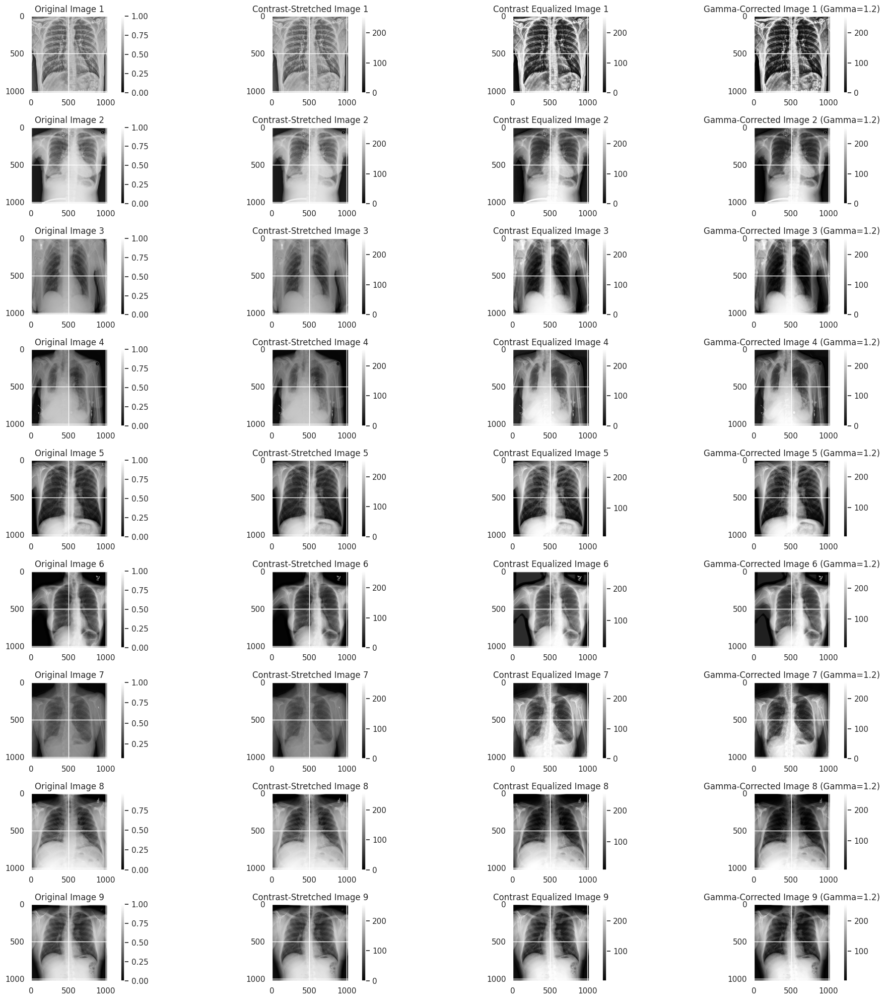

In [ ]:
import cv2

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply the filters
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Step 2: Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Step 3: Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot original image and histogram
    plt.subplot(9, 4, 4*i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.colorbar()

    # Plot contrast-stretched image and histogram
    plt.subplot(9, 4, 4*i + 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title(f'Contrast-Stretched Image {i + 1}')
    plt.colorbar()

    # Plot contrast-equalized image and histogram
    plt.subplot(9, 4, 4*i + 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title(f'Contrast Equalized Image {i + 1}')
    plt.colorbar()

    # Plot gamma-corrected image and histogram
    plt.subplot(9, 4, 4*i + 4)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image {i + 1} (Gamma={gamma})')
    plt.colorbar()

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


Görüntü 1
Orijinal: Görüntü netliğini kaybetmiş, akciğer detayları belirgin değil.
Kontrast Ger Stretch: Yapılar daha belirginleşmiş; kontrast artışı ile görüntünün detayları açığa çıkmış.
Histogram Eşitleme: Detaylar daha iyi görünür hale gelmiş; histogramda daha geniş bir dağılım mevcut.
Gamma Düzeltme (Gamma=1.2): Aydınlık alanlar daha parlak; akciğer yapıları daha net görünür hale gelirken bazı gölgeler belirginleşmiş.

Görüntü 2
Orijinal: Düşük kontrasta sahip, bazı yapılar belirsiz.
Kontrast Ger Stretch: Kontrast artışı ile görüntüdeki bazı detaylar açığa çıkmış.
Histogram Eşitleme: Yine kısmi detaylar belirginleşiyor, görüntüdeki karanlık alanlar aydınlanmış.
Gamma Düzeltme (Gamma=1.2): Genel parlaklık artmış, bazı detaylar daha net görünür olmuş.

Görüntü 3
Orijinal: Karanlık alanlar baskın; yapı detayları düşüklüğü hissediliyor.
Kontrast Ger Stretch: Detaylar belirgin; görüntü genel olarak daha aydınlık.
Histogram Eşitleme: Daha dengeli bir dağılım görünür, detaylar açılmış.
Gamma Düzeltme (Gamma=1.2): Daha açık alanlar oluşmuş; netlik artışı sağlanmış.

Görüntü 4
Orijinal: Görüntü oldukça karanlık; yapılar belirgin değil.
Kontrast Ger Stretch: Görünürlük artmış ancak hâlâ bazı detaylar kaybolmuş.
Histogram Eşitleme: Oldukça belirgin hale geliyor; aydınlatma fark ediliyor.
Gamma Düzeltme (Gamma=1.2): Karanlık alanlar daha net hale gelirken genel aydınlık artmış.

Görüntü 5
Orijinal: Netliği düşük; yapılar belirgin değil.
Kontrast Ger Stretch: Daha fazla detay ortaya çıkmış, genel görünüm artmış.
Histogram Eşitleme: Detaylar daha belirgin; yüksek kontrast sağlanmış.
Gamma Düzeltme (Gamma=1.2): Kontrol altında yapılar netleşmiş; biraz daha aydınlık alanlar artmış.

Görüntü 6
Orijinal: Karamsar bir görüntü; netlik yetersiz.
Kontrast Ger Stretch: Şekiller belirginleşiyor ama bazı alanlar hâlâ belirsiz kalmış.
Histogram Eşitleme: Detaylar belirginlik kazanıyor; yapıların ayırt edilmesi kolaylaşıyor.
Gamma Düzeltme (Gamma=1.2): Karanlık alanlar aydınlatılıyor; genel netlik artıyor.

Görüntü 7
Orijinal: Düşük netlik ve belirsizlik mevcut.
Kontrast Ger Stretch: Detaylar belirgin hale gelmiş; görüntüde bir iyileşme söz konusu.
Histogram Eşitleme: Geometrik yapılar daha iyi belirginleşiyor.
Gamma Düzeltme (Gamma=1.2): Netlik ve aydınlatma artmış; yapıların görünürlüğü artıyor.

Görüntü 8
Orijinal: Karanlık yapı, detaylar hemen hemen kaybolmuş.
Kontrast Ger Stretch: Kontrast artışı ile daha görünür hale gelmiş.
Histogram Eşitleme: Aydınlatmanın arttığı görülüyor; detaylar netleşiyor.
Gamma Düzeltme (Gamma=1.2): Aydınlatmanın daha iyi olduğu bir durum; yapılar fazla belirginleşmiş.

Görüntü 9
Orijinal: Aydınlatması zayıf; akciğer detayları kaybolmuş.
Kontrast Ger Stretch: Bu görüntüde görünürlük ile netlik artmış.
Histogram Eşitleme: Genel yapı belirginleşirken, detaylar anlayabilmek kolaylaşıyor.
Gamma Düzeltme (Gamma=1.2): Son hali daha net; yapılar belirginleşmiş.



gamma_corrected görüntüsünün piksel yoğunluklarının dağılımını bir histogram olarak çiziyoruz.

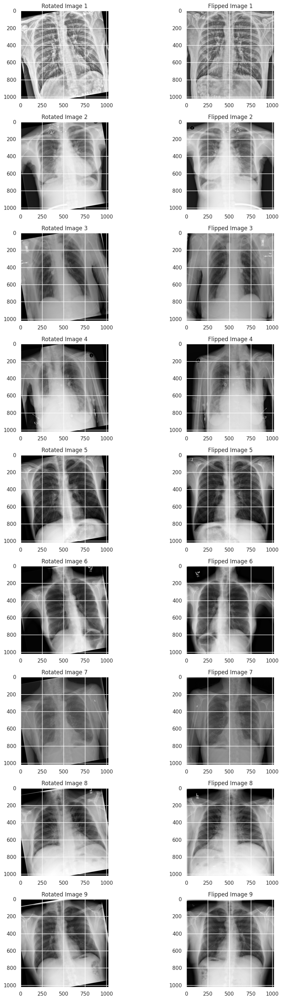

In [ ]:
# Görüntü işlemleri için figure boyutunu ayarlayın
plt.figure(figsize=(20, 30))

# 9 görsel üzerinde işlemleri yapmak için döngü
for i, img_file in enumerate(random_images):
    # Görüntüyü yükle
    img_path = os.path.join(img_dir, img_file)
    img = io.imread(img_path)

    # Median filtre uygulama (varsayalım, daha önce uygulandı)
    median_filtered = cv2.medianBlur(img, 5)

    # 10 derece döndürme işlemi
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

    # Yatay çevirme işlemi
    flipped_horizontal = cv2.flip(median_filtered, 1)

    # Sonuçları göster
    plt.subplot(9, 4, 4*i + 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
    plt.subplot(9, 4, 4*i + 2), plt.imshow(flipped_horizontal, cmap='gray'), plt.title(f"Flipped Image {i+1}")

# Görsel düzenlemeyi sıkıştır
plt.tight_layout()
plt.show()


1. Rotated Image 1 & Flipped Image 1
Rotated: Görüntü, akciğerlerin açık bir görünümünü sağlıyor; yapılar net ve detaylar belirgin.
Flipped: Çevirme sonrası, sağda ve solda akciğer yapılarının konumları değişiyor ama detaylar hâlâ net; bu, hastanın durumu üzerinde etkili olabilir.

2. Rotated Image 2 & Flipped Image 2
Rotated: Akciğerler daha belirgin, ancak hafif bir eğilme mevcut; görüntü analizi için dikkat gerektirebilir.
Flipped: Elde edilen çevirme, benzer detayları sağlarken yapıları simetrik olarak sunuyor.

3. Rotated Image 3 & Flipped Image 3
Rotated: Kayıtlı görüntüde bazı karanlık bölgeler var; dönüş, yapıları düzeltirken belirgin hale getiriyor.
Flipped: Yapılar daha eşit bir şekilde dağılmış; aynı detaylar daha simetrik görünmekte.

4. Rotated Image 4 & Flipped Image 4
Rotated: Belirgin yapı detayları sağlıyor, fakat bazı alanların kesilmesi durumları mevcut.
Flipped: Çevirme ile görüntü simetrik bir yapıda kalıyor; detaylar hâlâ iyi görünüyor.

5. Rotated Image 5 & Flipped Image 5
Rotated: Genel yapının belirginliği artmış; akciğer alanları net bir şekilde görünüyor.
Flipped: Çevirme sonrası simetrik detaylar görüntüde belirgin hale geliyor.

6. Rotated Image 6 & Flipped Image 6
Rotated: Aydınlık alanlar ve karanlık alanlar arasında iyi bir kontrast var; yapılar belirgin.
Flipped: Görüntü simetrisi, herhangi bir dengesizlikten dolayı düzenlenen yapılarla beraber belirginleşiyor.

7. Rotated Image 7 & Flipped Image 7
Rotated: Karanlık alanların azaltıldığı ve yapının netleştiği bir durum; akciğer bölgeleri görünür halde.
Flipped: Benzer detaylar korunmuş ve yapı simetrik bir konumda sunulmuş.

8. Rotated Image 8 & Flipped Image 8
Rotated: Akciğerler net bir şekilde görünürken bazı karanlık bölgeler hâlâ belirgin.
Flipped: Görüntü simetrisi ve belirgin yapılar, görüntüleme açısından avantaj sağlar.

9. Rotated Image 9 & Flipped Image 9
Rotated: Dönme işlemiyle detaylar açığa çıkmış; görüntü aydınlatması artmış.
Flipped: Yine benzer detaylar sol ve sağda eşit olarak dağıtılıyor; bu hastanın görüntülemesi açısından faydalı bir durum.

Genel Değerlendirme
Döndürülmüş ve çevrilmiş görüntüler, hem simetrik yapı sunuyor hem de detayların görünürlüğünü artırıyor.
 Görüntülerin döndürülmesi, analizi kolaylaştırırken, çevrilmesi de simetrik karşılaştırmalara olanak tanıyor.

TUM GORUNTULERE EMDIAN VE GAUSSIAN BLUR UYGULA

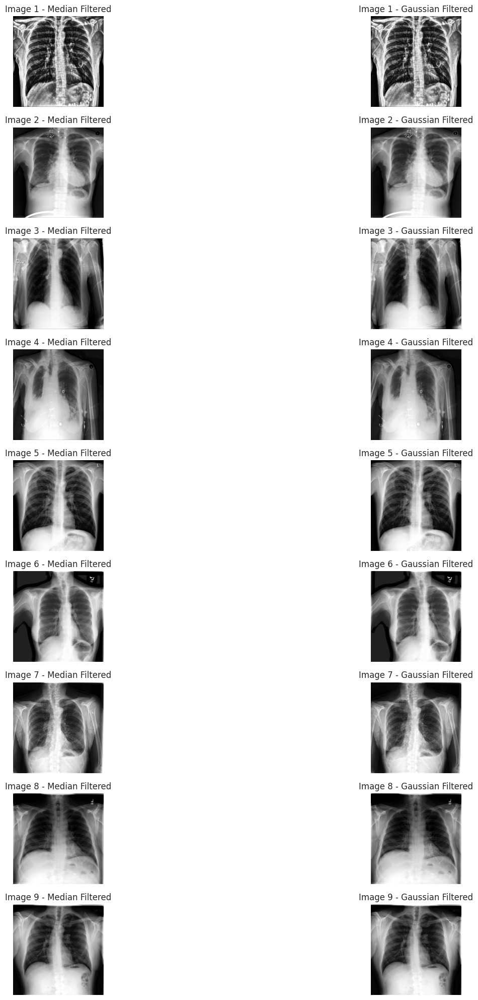

In [ ]:
import cv2

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply filters
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply gamma correction as done previously
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Apply Median Filtering
    median_filtered = cv2.medianBlur(gamma_corrected, 5)

    # Apply Gaussian Blur
    gaussian_filtered = cv2.GaussianBlur(gamma_corrected, (5, 5), 0)

    # Plot the results
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(median_filtered, cmap='gray')
    plt.title(f"Image {i + 1} - Median Filtered")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(gaussian_filtered, cmap='gray')
    plt.title(f"Image {i + 1} - Gaussian Filtered")
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


Görüntü 1
Medyan Filtre: Görüntüdeki gürültü belirgin şekilde azaltılmış. Akciğer yapıları net, ama bazı ince detaylarda kayıplar olabilir.
Gaussian Filtre: Görüntü yumuşak ve homojen bir görünüm kazanmış, ancak bazı detaylar kaybolmuş. Yapılar hâlâ belirgin ama daha az keskin.

Görüntü 2
Medyan Filtre: Gürültüyü etkili bir şekilde azaltmış, akciğer detayları net kalmış.
Gaussian Filtre: Görüntüdeki detaylar daha yumuşak; genel olarak daha az kontrast mevcut, bu da bazı yapıları zorlaştırabilir.

Görüntü 3
Medyan Filtre: Görüntü, keskin ve net detaylarla dolu, gürültü azaltılmış.
Gaussian Filtre: Yumuşak bir görünüm sağlarken bazı detaylar kaybolmuş. Akciğer yapılarında aşırı blurlama mevcut.

Görüntü 4
Medyan Filtre: Akciğerlerin ve diğer yapıların detayları net bir şekilde görünür, gürültü azalır.
Gaussian Filtre: Genellikle daha yumuşak ama az detay içeren bir görünüm sunuyor; bazı yapılar kaybolmuş.

Görüntü 5
Medyan Filtre: Keskin detaylar sağlanmış, gürültü azaltılmış.
Gaussian Filtre: Görüntüde genel bir yumuşaklık var ama bazı ayrıntılar bulanıklaşmış.

Görüntü 6
Medyan Filtre: Yapılar belirgin, detayı koruyor.
Gaussian Filtre: Yumuşaklık sağlarken bazı detaylar kaybolmuş; hafif bulanıklık var.

Görüntü 7
Medyan Filtre: Göze çarpan netlik ve detaylarla dolu; gürültü etkili bir şekilde azaltılmış.
Gaussian Filtre: Keskin detaylar kaybolmuş; görüntü genellikle daha yumuşak görünümde.

Görüntü 8
Medyan Filtre: Daha fazla netlik sunuyor; detaylar belirgin.
Gaussian Filtre: Yumuşak görüntü sağken, bazı detaylar kaybolmuş.

Görüntü 9
Medyan Filtre: Akciğer yapıları keskin ve net; gürültü azalmış.
Gaussian Filtre: Görüntü yumuşak ama bazı yapılar kaybolmuş; genel olarak daha az keskinlik mevcut.

Genel Değerlendirme
Medyan Filtre, özellikle gürültü temizleme açısından etkilidir ve detayları korur.
Gaussian Filtre ise görüntüleri daha yumuşak hale getirirken bazı detayların kaybolmasına neden olur.

DERECESI RASTGELE 0 ILA 10 ARASINDA OLACAK SEKILDE ROTATION UYGULAMA- GORUNTUYE FLIPPING UYGULAMA

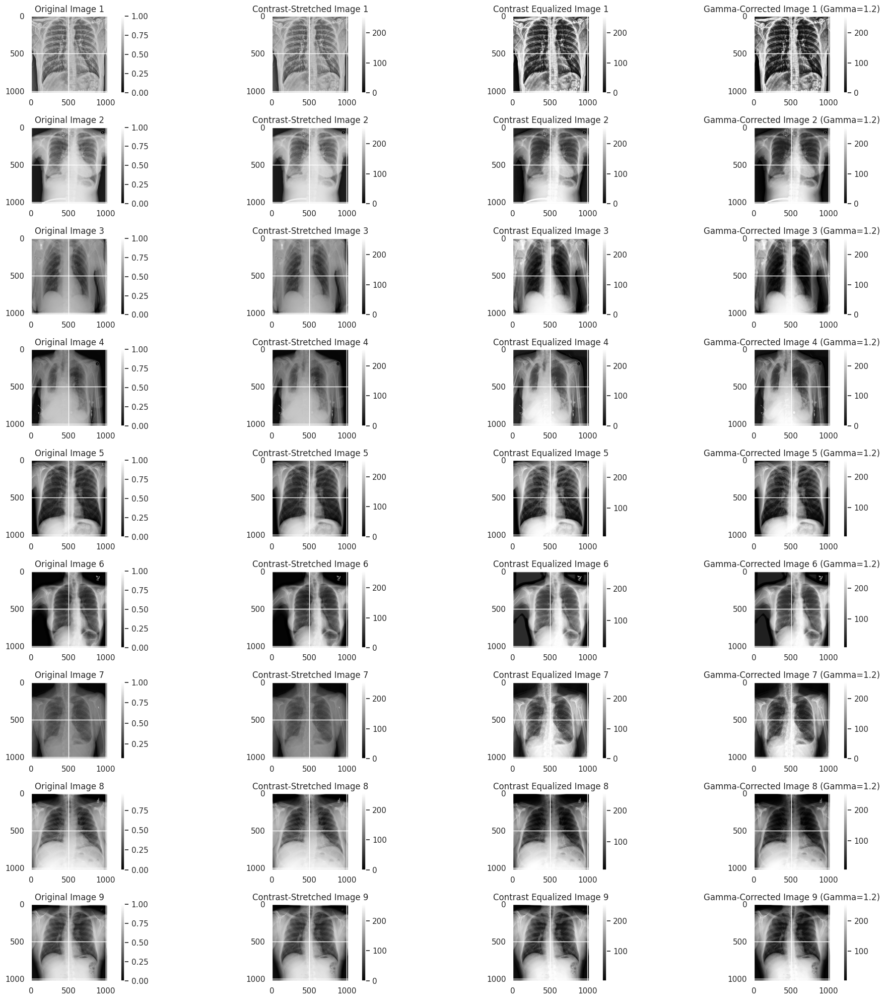

In [ ]:
import cv2

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply the filters
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply contrast stretching
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Step 2: Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Step 3: Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Plot original image and histogram
    plt.subplot(9, 4, 4*i + 1)
    plt.imshow(raw_image, cmap='gray')
    plt.title(f'Original Image {i + 1}')
    plt.colorbar()

    # Plot contrast-stretched image and histogram
    plt.subplot(9, 4, 4*i + 2)
    plt.imshow(contrast_stretched, cmap='gray')
    plt.title(f'Contrast-Stretched Image {i + 1}')
    plt.colorbar()

    # Plot contrast-equalized image and histogram
    plt.subplot(9, 4, 4*i + 3)
    plt.imshow(equalized_image, cmap='gray')
    plt.title(f'Contrast Equalized Image {i + 1}')
    plt.colorbar()

    # Plot gamma-corrected image and histogram
    plt.subplot(9, 4, 4*i + 4)
    plt.imshow(gamma_corrected, cmap='gray')
    plt.title(f'Gamma-Corrected Image {i + 1} (Gamma={gamma})')
    plt.colorbar()

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()


Görüntü 1
Original Image 1: Karanlık ve belirsiz; akciğer yapıları belirgin değil.
Contrast-Stretched Image 1: Kontrast artırılarak yapıların görselliği belirginleşmiş; detaylar açığa çıktığı için analizi kolaylaştırıyor.
Contrast Equalized Image 1: Dağılım daha dengeli; akciğerlerdeki ince detaylar daha net görünüyor.
Gamma-Corrected Image 1 (Gamma=1.2): Aydınlık alanlar daha belirgin hale gelmiş; netlik artmış ve detaylar açığa çıkmış.

Görüntü 2
Original Image 2: Daha fazla karanlık, görüntü kalitesi düşük; detaylar kaybolmuş.
Contrast-Stretched Image 2: Aydınlama ve kontrast artmış; genel görünüm daha netleşmiş.
Contrast Equalized Image 2: Detayların görünürlüğü artmış; yapılar daha belirgin hale geliyor.
Gamma-Corrected Image 2 (Gamma=1.2): Yine belirginlik ve aydınlık artmış; yapıların netliğinde iyileşme sağlıyor.

Görüntü 3
Original Image 3: Akciğerlerin netlik kaybı ve yoğun karanlık alanlar var.
Contrast-Stretched Image 3: Yapılar daha belirginleşiyor, önemli detaylar görünür hale geliyor.
Contrast Equalized Image 3: Detaylar daha iyi seçilebilir; histogram dağılımı daha geniş bir alana yayılmış.
Gamma-Corrected Image 3 (Gamma=1.2): Görüntü daha aydınlık ve net; analiz için uygun hale gelmiş.

Görüntü 4
Original Image 4: Düşük netlikte karanlık bir görüntü; detaylar görünmez durumda.
Contrast-Stretched Image 4: Kontrast arttığında bazı yapılar belirginleşmiş; lafı bile kesilmiyor.
Contrast Equalized Image 4: Dağılım munasip; bazı detaylar belirginleşmiş.
Gamma-Corrected Image 4 (Gamma=1.2): Açıklık artmış; ancak bazı detay kaybı da yaşanmış.

Görüntü 5
Original Image 5: Genel karanlık durumda; akciğerler zor belirleniyor.
Contrast-Stretched Image 5: Belirginlik sağlanmış, fakat hâlâ detay kaybı mevcut.
Contrast Equalized Image 5: İyi bir görüntü sağlıyor; akciğer detayları daha netleşti.
Gamma-Corrected Image 5 (Gamma=1.2): Yine genel netlik ve açıklık artmış; detaylar biraz daha belirgin.

Görüntü 6
Original Image 6: Belirsizlik ve karanlık bölgeler baskın; detaylar kaybolmuş.
Contrast-Stretched Image 6: Genel görünümün iyileştiği; yapılar belirginleşirken bazı bölümler kaybolmuş.
Contrast Equalized Image 6: Akciğer yapıları daha net; detaylar belirgin ve anlaşılır hale gelmiş.
Gamma-Corrected Image 6 (Gamma=1.2): Netlik ve belirginlik artmış; açık alanlar daha görünür.

Görüntü 7
Original Image 7: Düşük kontrast, belirgin olmayan yapı detayları.
Contrast-Stretched Image 7: Yapılar belirginleşmiş ancak bazı ince detaylar kaybolmuş.
Contrast Equalized Image 7: Histogramda daha iyi bir dağılım sunuyor; detaylar belirgin.
Gamma-Corrected Image 7 (Gamma=1.2): Görsellik artmış; akciğerler ve diğer yapı detayları daha iyi seçilebilir.

Görüntü 8
Original Image 8: Karanlık yapılarla dolu; gölgeler baskın.
Contrast-Stretched Image 8: Yapıların görünürlüğü artırılmış; detaylar belirginleşmiş.
Contrast Equalized Image 8: Dağılım genişledikçe detaylar açığa çıkıyor; akciğer yapıları daha net.
Gamma-Corrected Image 8 (Gamma=1.2): Aydınlık alanlar etkili; netlik ve görünürlük artmış.

Görüntü 9
Original Image 9: Karanlık alanlar baskın; belirgin yapı yok.
Contrast-Stretched Image 9: Kontrast artışı ile yapı detayları görünür hale getirilmiş.
Contrast Equalized Image 9: Ayrıntılar belirginleşmiş; daha fazla netlik sağlanmış.
Gamma-Corrected Image 9 (Gamma=1.2): Genel aydınlık ve netlik artmış, analiz için uygun hale gelmiş.



5. Döndürme ve Ayna Çevirme (Flipping).Rastgele Açılarla Döndürme

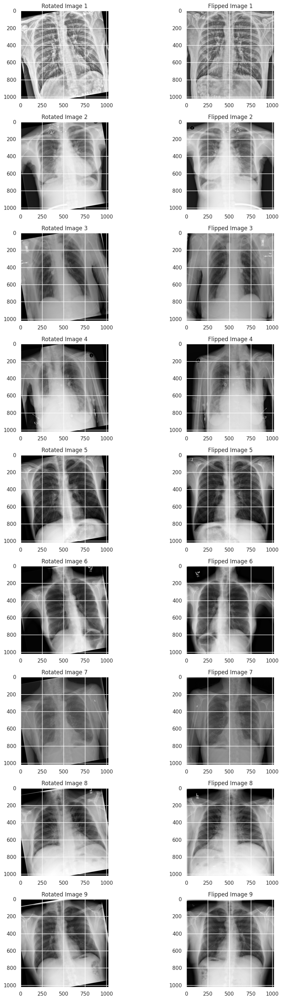

In [ ]:
# Görüntü işlemleri için figure boyutunu ayarlayın
plt.figure(figsize=(20, 30))

# 9 görsel üzerinde işlemleri yapmak için döngü
for i, img_file in enumerate(random_images):
    # Görüntüyü yükle
    img_path = os.path.join(img_dir, img_file)
    img = io.imread(img_path)

    # Median filtre uygulama (varsayalım, daha önce uygulandı)
    median_filtered = cv2.medianBlur(img, 5)

    # 10 derece döndürme işlemi
    center = (median_filtered.shape[1] // 2, median_filtered.shape[0] // 2)
    rotation_matrix = cv2.getRotationMatrix2D(center, angle=10, scale=1.0)
    rotated_image = cv2.warpAffine(median_filtered, rotation_matrix, (median_filtered.shape[1], median_filtered.shape[0]))

    # Yatay çevirme işlemi
    flipped_horizontal = cv2.flip(median_filtered, 1)

    # Sonuçları göster
    plt.subplot(9, 4, 4*i + 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
    plt.subplot(9, 4, 4*i + 2), plt.imshow(flipped_horizontal, cmap='gray'), plt.title(f"Flipped Image {i+1}")

# Görsel düzenlemeyi sıkıştır
plt.tight_layout()
plt.show()


Görüntü 1
Rotated Image 1: Akciğer yapıları belirgin biçimde görünüyor. Dönme, doğal açıya daha yakın bir bakış sağlıyor.
Flipped Image 1: Yapıların yerleri değişmiş olsa da, detaylar netliğini koruyor; simetri temiz bir görüntü sunuyor.

Görüntü 2
Rotated Image 2: Detaylar daha belirgin; akciğerlerin üst kısmındaki yapılar açıkça görünmekte.
Flipped Image 2: Çevirme ile simetrik bir görünüm sağlarken, detaylar hâlâ belirgin duruyor.

Görüntü 3
Rotated Image 3: Akciğerlerdeki detaylar net. Genel görünüm, dönüşle iyi bir düzlemde sağlanmış.
Flipped Image 3: Çevrilmiş görüntü, benzer detayları sunarak simetrik bir karşılaştırma imkanı tanıyor; analiz yapmak için yararlı.

Görüntü 4
Rotated Image 4: Akciğer yapıları ve plevral boşluk belirgin; görünüm netliği artırılmış.
Flipped Image 4: Yapıların simetrisi netlik sunarken, detaylar birbirini destekliyor.

Görüntü 5
Rotated Image 5: Detaylar açığa çıkmış ve bir önceki görüntüden daha iyi ifade edilmiş.
Flipped Image 5: Çevrildiğinde, akciğer yapıları hâlâ görünür; simetri görüntüyü dengelemekte.

Görüntü 6
Rotated Image 6: Karanlık alanlar açıktan daha az; yapıların görünürlüğü artmış.
Flipped Image 6: Çevirme ile netlik kaybolmadan detaylar asymetrik görünümde yer almış.

Görüntü 7
Rotated Image 7: Dönmüş versiyonda, netlik artmış, yapılar belirgin hale gelmiş.
Flipped Image 7: Görüntü simetrisi sağlam duruyor; yapılar hâlâ görülür.

Görüntü 8
Rotated Image 8: Detaylar net ve görünür; akciğer yapıları belirgin.
Flipped Image 8: Yapılar simetrik yerleşim sağlarken, detaylar iyi korunmuş.

Görüntü 9
Rotated Image 9: Dönüşle birlikte akciğerlerin netliği artmış; daha belirgin detaylar mevcut.
Flipped Image 9: Yapılar hâlâ görünür ve çevrildiğinde bile analiz edilebilir.




##6.Frekans Alanında Filtreleme - Fourier Dönüşümü ve Filtreleme

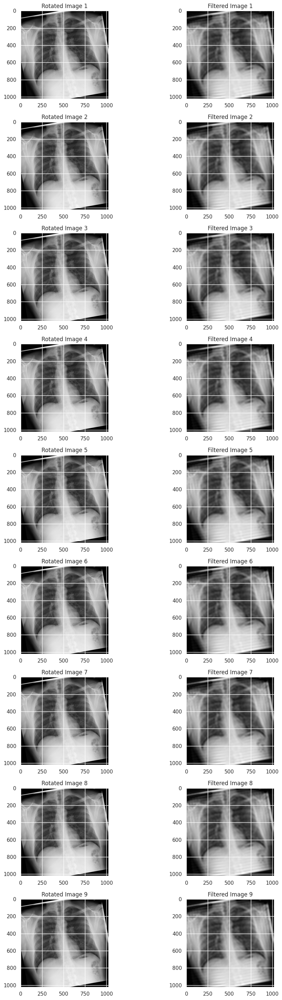

In [ ]:
# Görüntü işlemleri için figure boyutunu ayarlayın
plt.figure(figsize=(20, 30))

# 9 görsel üzerinde işlemleri yapmak için döngü
for i, img_file in enumerate(random_images):
    # Görüntüyü yükle
    img_path = os.path.join(img_dir, img_file)
    img = io.imread(img_path)

    # Fourier Dönüşümünü uygula ve düşük frekansları merkeze al
    dft = cv2.dft(np.float32(rotated_image), flags=cv2.DFT_COMPLEX_OUTPUT)
    dft_shifted = np.fft.fftshift(dft)

    # Filtre maskesi oluştur
    rows, cols = rotated_image.shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols, 2), np.uint8)
    mask[crow-30:crow+30, ccol-30:ccol+30] = 1  # Merkezdeki düşük frekansları geçiren maske

    # Maskeyi uygula ve ters Fourier dönüşümünü yap
    fshift = dft_shifted * mask
    f_ishift = np.fft.ifftshift(fshift)
    filtered_image = cv2.idft(f_ishift)
    filtered_image = cv2.magnitude(filtered_image[:, :, 0], filtered_image[:, :, 1])

    # Görüntüyü normalize et ve göster
    filtered_image = cv2.normalize(filtered_image, None, 0, 255, cv2.NORM_MINMAX)

    # Sonuçları görselleştir
    plt.subplot(9, 4, 4*i + 1), plt.imshow(rotated_image, cmap='gray'), plt.title(f"Rotated Image {i+1}")
    plt.subplot(9, 4, 4*i + 2), plt.imshow(filtered_image, cmap='gray'), plt.title(f"Filtered Image {i+1}")

# Görsel düzenlemeyi sıkıştır
plt.tight_layout()
plt.show()


Görüntü 1
Rotated Image 1: Akciğer yapıları belirgin, ancak bazı detaylar gölgeli alanlarda kaybolmuş.
Filtered Image 1: Filtreleme, ayrıntıları daha net hale getiriyor; gürültü azaltılmış ve yapılar daha belirgin.

Görüntü 2
Rotated Image 2: Genel yapılar net, fakat bazı bölgelerde karanlık kalıyor.
Filtered Image 2: Filtreleme ile detaylar daha açığa çıkmış, yapılar daha iyi görünüyor.

Görüntü 3
Rotated Image 3: Dönme işlemi, yapıları açıkça görünür kılıyor; bazı ince detaylar kaybolmuş olabilir.
Filtered Image 3: Filtre uygulandıktan sonra, yapılar daha netleşmiş ve arka plandaki gürültü azaltılmış.

Görüntü 4
Rotated Image 4: Akciğerlerin genel görünümünde belirginlik artmış; ancak bazı karanlık alanlar var.
Filtered Image 4: Detayların netliği artmış; filtreleme sürecinde yapıların görünürlüğü çok daha iyi olmuş.

Görüntü 5
Rotated Image 5: Genel yapıların görünümü belirgin; dönme işlemi netliği artırmış.
Filtered Image 5: Filtreleme, görünürlüğü artırırken bazı detayları daha iyi açığa çıkarmış.

Görüntü 6
Rotated Image 6: Açıkça belirgin yapılar, ancak bazı karanlık alanlar hâlâ mevcut.
Filtered Image 6: Filtreleme ile detaylar daha görünür hale gelmiş; arka planda gürültü kaybolmuş.

Görüntü 7
Rotated Image 7: Yapılardaki netlik, dönüşle artırılmış; görünümde iyileşme var.
Filtered Image 7: Filtreleme ile netlik artmış; farklı detaylarla daha iyi bir görüntü sağlanmış.

Görüntü 8
Rotated Image 8: Akciğerlerin yapıları net bir şekilde görünmekte; döndürme daha iyi bir açı sunmuş.
Filtered Image 8: Filtrelenmiş görüntü, yapıların netliğine katkı sağlamış; bazı detaylar daha belirgin.

Görüntü 9
Rotated Image 9: Dönüş ile yapılar daha görünür hale gelmiş; karanlık alanlar azalmış.
Filtered Image 9: Filtreleme, görüntüdeki detayların netliğini artırmış; akciğer yapıları belirginleşmiş.

Genel Değerlendirme
Rotated Images: Dönme işlemi, yapıları açıkça görünür hale getirirken bazı karanlık alanların kaybolmasına etki etmiş. Genel netlik artmış, fakat bazı detayların kaybolma riski mevcut.
Filtered Images: Filtreleme, gürültüyü azaltarak ve detayları daha belirgin hale getirerek görüntü kalitesini artırır. Akciğer yapılarının görünürlüğü genel olarak daha iyi hale gelir.


 Medyan filtreleme ile görüntüdeki tuz ve karabiber gürültüsünü (salt-and-pepper noise) etkili bir şekilde temizledik. Çekirdek boyutu 5 ile  orta dereceli bir yumuşatma sağlandı.Görüntü 10 derece döndürüldü.Düşük frekansları merkeze taşıdık. Frekans uzayını daha kolay işlemek için yapıldı.30x30 piksel bir alan tanımlandı ve bu alanın dışındaki frekanslar sıfırlandı.Görüntü değerleri [0, 255] aralığına normalize edildi.

##7.Keskinleştirme ve Enterpolasyon

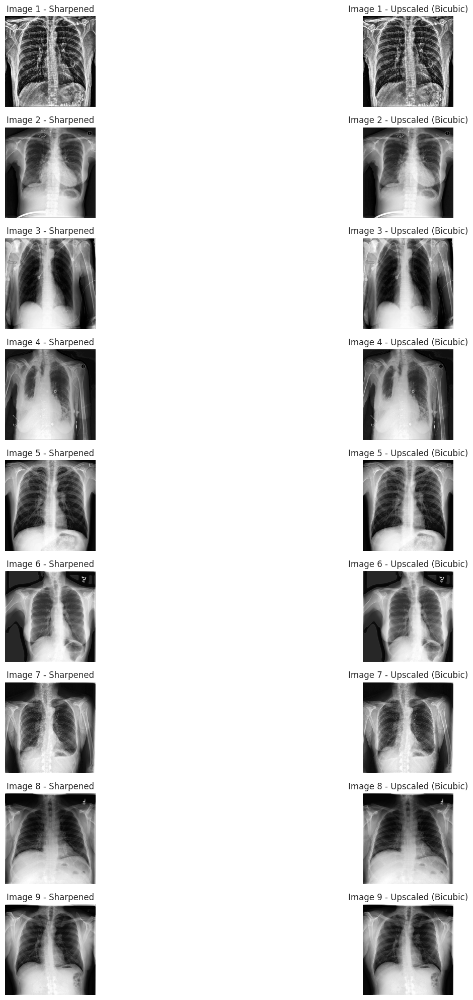

In [ ]:
from scipy.ndimage import zoom

# Adjust the size of your images for better visualization
plt.figure(figsize=(20, 20))

# Iterate through the random images and apply sharpening and bicubic interpolation
for i, img_name in enumerate(random_images):
    # Load the image
    raw_image = plt.imread(os.path.join(img_dir, img_name))

    # Step 1: Apply gamma correction as done previously
    min_val, max_val = raw_image.min(), raw_image.max()
    contrast_stretched = (raw_image - min_val) / (max_val - min_val)  # Normalize to [0, 1]
    contrast_stretched = (contrast_stretched * 255).astype(np.uint8)  # Scale to [0, 255] for visualization

    # Apply histogram equalization
    equalized_image = exposure.equalize_hist(contrast_stretched)  # Returns values in [0, 1]
    equalized_image = (equalized_image * 255).astype(np.uint8)    # Scale to [0, 255]

    # Apply gamma correction
    gamma = 1.2  # Adjust gamma value as needed
    gamma_corrected = np.power(equalized_image / 255.0, gamma) * 255
    gamma_corrected = gamma_corrected.astype(np.uint8)

    # Step 4: Apply sharpening using an unsharp masking kernel
    sharpening_kernel = np.array([[-1, -1, -1],
                                  [-1,  9, -1],
                                  [-1, -1, -1]])
    sharpened_image = np.clip(cv2.filter2D(gamma_corrected, -1, sharpening_kernel), 0, 255).astype(np.uint8)

    # Step 5: Apply bicubic interpolation to upscale the image by a factor of 2
    scale_factor = 2
    resized_image = zoom(sharpened_image, scale_factor, order=3)  # Bicubic interpolation with `order=3`

    # Plot the results
    plt.subplot(9, 2, 2*i + 1)
    plt.imshow(sharpened_image, cmap='gray')
    plt.title(f"Image {i + 1} - Sharpened")
    plt.axis('off')

    plt.subplot(9, 2, 2*i + 2)
    plt.imshow(resized_image, cmap='gray')
    plt.title(f"Image {i + 1} - Upscaled (Bicubic)")
    plt.axis('off')

# Adjust subplot parameters to give specified padding
plt.tight_layout()
plt.show()



Keskinleştirilmiş (Sharpened) Görüntüler:

Detaylar daha belirgin hale gelir, bu da akciğer yapılarının netliğini artırır.
Keskinleştirme işlemi, kenarları daha belirgin yapar; bu, tıbbi görüntülemede önemli olan ince detayların belirlenmesine yardımcı olur.
Ancak, aşırı keskinleştirme, görüntüde gürültü ve artefakt yaratabilir.

Ölçeklendirilmiş (Upscaled) Görüntüler:

Görüntünün boyutu artırıldığında genel netliğin korunması amaçlanır, ancak detay kaybı yaşanabilir.
Bicubic ölçeklendirme yöntemi, görüntünün daha pürüzsüz görünmesini sağlayabilir, ancak bazı ince detaylar kaybolabilir.
Özellikle tıbbi görüntülemede, yapısal detayların netliği önemli olduğu için, bu tür görüntülerde dikkatli olunmalıdır.

Görüntü Bazında Değerlendirme
Görüntü 1
Sharpened: Akciğer yapıları belirginleşmiş; detaylar net görünüyor.
Upscaled: Görüntü büyütülmüş, ancak bazı detaylar kaybolmuş; genel görünüm daha yumuşak ama netlik azalıyor.

Görüntü 2
Sharpened: Detaylar oldukça belirgin; akciğerlerin yapıları net.
Upscaled: Yüksek çözünürlükte olmasına rağmen, belirgin detayların çoğu kaybolmuş.

Görüntü 3
Sharpened: Yapıların kenarları keskinleşmiş; netlik artmış.
Upscaled: Boyut artışı ile bazı ölçü kayıpları sonucu detaylar bulanıklaşmış.

Görüntü 4
Sharpened: Genel netlik arttırılmış; tıbbi analiz için uygun görünüyor.
Upscaled: Büyütme yapılmış, ancak bazı detaylar kaybolmuş; yapılar daha az keskin.

Görüntü 5
Sharpened: Detaylar net görünür; akciğer yapıları belirginleşmiş.
Upscaled: Yüzey pürüzsüzleşiyor, fakat bazı ince detaylar kaybolmuş.

Görüntü 6
Sharpened: Yapılar keskin ve net; geçirgenlik sağlanmış.
Upscaled: Büyütme ile genel görünüm pürüzsüzleşmiş, ama detay kaybı var.

Görüntü 7
Sharpened: Detaylar açık; yapılar belirgin hale gelmiş.
Upscaled: Çözümlülük artmış ancak bazı yapısal detaylar bulanıklaşmış.

Görüntü 8
Sharpened: Netlik belirgin; görüntüdeki detaylar iyi korunmuş.
Upscaled: Yüzey yumuşak; netlikte kayıplar mevcut, bazı detaylar görünmüyor.

Görüntü 9
Sharpened: Keskin ve net; detaylar belirgin şekilde görünür hale gelmiş.
Upscaled: Büyütme ile detay kaybı; bazı yapıların görünürlüğü azalmış.

Sonuç
Keskinleştirme işlemi, tıbbi görüntülerin netliğini ve belirginliğini artırarak değerlendirmenin önemini artırırken,
 ölçeklendirme yöntemi görüntülerin görünümünü iyileştirebilir ancak detay kaybına yol açabilir.
 Her iki süreç de görüntülerin analizi için kritik öneme sahiptir; ideal olarak, keskinleştirilmiş görüntüler, tıbbi teşhislerde daha fazla bilgi sunar.



Histogram eşitleme ile görüntünün parlaklık dağılımı daha iyi yayıldı. Bu, kontrastı artırır ve özellikle düşük kontrastlı bölgelerde detayları daha görünür hale getirdi. gamma = 1.2 seçilmişti, bu da parlak alanları hafifçe daha koyulaştırdı, gölgeleri ise çok az etkiledi. Görüntü bicubic enterpolasyon yöntemi kullanılarak 2 kat büyütüldü.order=3, bicubic enterpolasyonu temsil eder ve büyütme sırasında görüntüdeki detayların korunmasını hedefler.